## Table of Contents
- [Dataset](#section1)
- [Transformting postcode into latitude and longitude](#section2)
- [Creating new features based on latitude and longitude](#section3)
- [Transforming some features + Removing some rare observations](#section4)
- [EDA ](#section5)
- [Dataset2: Built Environement](#section6)
- [Spatial Autocorrelation](#section7)
- [Correlation (Phik)](#section8)


**Packages**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import geopandas as gpd
import pgeocode
from geopy.distance import geodesic
from shapely.geometry import Point, LineString
from pointpats.centrography import mean_center, euclidean_median
import pointpats

import scipy.stats as stats
from pysal.lib import weights
from pysal.explore import esda
%matplotlib inline

from splot.esda import lisa_cluster
import matplotlib.pyplot as plt
from esda.moran import Moran_Local
from libpysal import weights

from shapely.geometry import Point
import phik

import math
from haversine import haversine
from scipy.spatial import distance
import requests
import osmnx as ox
import networkx as nx 
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

<a id='section1'></a>
## Dataset (ODIN22)
[Back to Table of Contents](#Table-of-Contents)

In [3]:
# load the filtered/cleaned dataset
pd.set_option('display.max_columns', None)
df = pd.read_csv("odin_cleaned.csv", index_col=0)

In [3]:
df.shape

(180464, 27)

<a id='section2'></a>
## Transforming postcode into latitude and longitude
[Back to Table of Contents](#Table-of-Contents)

In [4]:
# function that converts 4-digit postcode into latitude and longitude
# part of this code is adopted from: https://medium.com/@pether.maciejewski/python-with-pgeocode-and-pandas-postal-codes-to-geo-coordinates-f75af689cc56

### function to change postal code into geo_coordinates 
def postalcodes_geo_coordinates (df1, post1, lat_rename, lon_rename, post_rename):
    df1[post1]= df1[post1].astype("int64")
    
    postal_codes = df1[post1].values.astype("str").tolist()
    nomi = pgeocode.Nominatim('NL')
    lat1= nomi.query_postal_code(postal_codes)
    lat1 = lat1[["postal_code","latitude", "longitude"]]
    
    # rename 
    lat1.rename(columns={"postal_code": post_rename, 
                         "latitude": lat_rename, "longitude": lon_rename}, inplace=True)
    
    # change  the type
    lat1[post_rename] = lat1[post_rename].astype("int64")
    
    # remove duplicates
    lat1= lat1.drop_duplicates(subset=post_rename)
    
    return lat1


In [5]:
## converting postal codes into lat and lon
lat_living= postalcodes_geo_coordinates(df, "HomePostalCode", "LatitudeLiving", 
                                       "LongitudeLiving", "postal_code")  
lat_arr= postalcodes_geo_coordinates(df, "ArrivalPostalCode", "LatitudeArrival", 
                                       "LongitudeArrival", "postal_code_arr")

lat_departure= postalcodes_geo_coordinates(df, "DeparturePostalCode", "LatitudeDeparture", 
                                       "LongitudeDeparture", "postal_code_dep")

In [6]:
# merge latitude and logitude dataframes with odin dataset
df = pd.merge(df, lat_living, left_on='HomePostalCode',
                     right_on="postal_code", how='left')
df = pd.merge(df, lat_arr, left_on='ArrivalPostalCode',
                     right_on="postal_code_arr", how='left')
df = pd.merge(df, lat_departure, left_on='DeparturePostalCode',
                     right_on="postal_code_dep", how='left')

<a id='section3'></a>
## Creating new features based on latitude and longitude (OSM)
[Back to Table of Contents](#Table-of-Contents)

In [7]:
# to avoid memory issues extract non-duplicate combination of lat and long 
lat = df[["DeparturePostalCode", "ArrivalPostalCode"]]
lat = lat.drop_duplicates(subset=["DeparturePostalCode", "ArrivalPostalCode"])

lat_arr= postalcodes_geo_coordinates(lat, "ArrivalPostalCode", "LatitudeArrival", 
                                       "LongitudeArrival", "postal_code_arr")

lat_departure= postalcodes_geo_coordinates(lat, "DeparturePostalCode", "LatitudeDeparture", 
                                       "LongitudeDeparture", "postal_code_dep")


lat = pd.merge(lat, lat_arr, left_on='ArrivalPostalCode',
                     right_on="postal_code_arr", how='left')
lat = pd.merge(lat, lat_departure, left_on='DeparturePostalCode',
                     right_on="postal_code_dep", how='left')
lat.to_csv("lat.csv")


In [ ]:
# part of this code is from: # https://github.com/Project-OSRM/osrm-backend/issues/6258

# Function to calculate duration by cycling between two points
def duration_by_cycling(src, dst):
    url = f'https://routing.openstreetmap.de/routed-bike/route/v1/driving/{src[1]},{src[0]};{dst[1]},{dst[0]}'
    response = requests.get(url)
    data = response.json()
    try:
        duration = data['routes'][0]['duration']
        return duration
    except KeyError:
        print("Error: Unable to retrieve duration from API response.")
        return None


for index, row in lat.iterrows():
    dep_coords = (row['LatitudeDeparture'], row['LongitudeDeparture'])
    arr_coords = (row['LatitudeArrival'], row['LongitudeArrival'])
    
    duration = duration_by_cycling(arr_coords, dep_coords)
    
    if duration is not None:

        lat.at[index, 'Duration_by_cycling'] = duration

# save the duration dataset
lat.to_csv("duration_by_driving.csv")



In [ ]:
def duration_by_cycling(src, dst):
    url = f'https://routing.openstreetmap.de/routed-bike/route/v1/driving/{src[1]},{src[0]};{dst[1]},{dst[0]}'
    response = requests.get(url)
    data = response.json()
    try:
        duration = data['routes'][0]['duration']
        return duration
    except KeyError:
        print("Error: Unable to retrieve duration from API response.")
        return None

for index, row in lat.iterrows():
    dep_coords = (row['LatitudeDeparture'], row['LongitudeDeparture'])
    arr_coords = (row['LatitudeArrival'], row['LongitudeArrival'])
    
    duration = duration_by_cycling(arr_coords, dep_coords)
    
    if duration is not None:
       
        lat.at[index, 'Duration_by_cycling'] = duration

# Save datast
lat.to_csv("Duration_by_cycling.csv")

#8:55

In [ ]:
def duration_by_foot(src, dst):
    url = f'https://routing.openstreetmap.de/routed-foot/route/v1/driving/{src[1]},{src[0]};{dst[1]},{dst[0]}'
    response = requests.get(url)
    data = response.json()
    duration = data['routes'][0]['duration']
    return duration


for index, row in lat.iterrows():
    dep_coords = (row['LatitudeDeparture'], row['LongitudeDeparture'])
    arr_coords = (row['LatitudeArrival'], row['LongitudeArrival'])
    

    duration = duration_by_foot(arr_coords, dep_coords)
    
   
    lat.at[index, 'Duration_by_foot'] = duration


lat.to_csv("duration_by_foot.csv")

In [8]:
# merge dataset
duration_by_driving = pd.read_csv("duration_by_driving.csv", index_col=0)
duration_by_driving = duration_by_driving[["DeparturePostalCode", "ArrivalPostalCode", "Duration_by_driving"]]

df = pd.merge(df, duration_by_driving, 
              left_on=["DeparturePostalCode", "ArrivalPostalCode"],
              right_on=["DeparturePostalCode", "ArrivalPostalCode"], 
              how='left')

In [9]:
# merge dataset
duration_by_foot = pd.read_csv("duration_by_foot.csv", index_col=0)
duration_by_foot= duration_by_foot[["DeparturePostalCode", "ArrivalPostalCode", "Duration_by_foot"]]

df = pd.merge(df, duration_by_foot, 
              left_on=["DeparturePostalCode", "ArrivalPostalCode"],
              right_on=["DeparturePostalCode", "ArrivalPostalCode"], 
              how='left')

In [10]:
# merge dataset
duration_by_cycling = pd.read_csv("Duration_by_cycling.csv", index_col=0)
duration_by_cycling= duration_by_cycling[["DeparturePostalCode", "ArrivalPostalCode", "Duration_by_cycling"]]

df = pd.merge(df, duration_by_cycling, 
              left_on=["DeparturePostalCode", "ArrivalPostalCode"],
              right_on=["DeparturePostalCode", "ArrivalPostalCode"], 
              how='left')


In [ ]:
# part of the code is borrowed from: 
# https://stackoverflow.com/questions/52231122/python-osmnx-extract-only-big-freeways-of-a-country
# extract unique latitude and longitude to avoid the computational problem extract unique lat and long
unique_coords = df[['LatitudeLiving', 'LongitudeLiving']].drop_duplicates()

# empty list to store values
results = []

# 
for index, row in unique_coords.iterrows():
    # extract latitude and longitude
    lat = row['LatitudeLiving']
    lon = row['LongitudeLiving']
    
    try:
        # bus stops within an 1000-meter radius
        bus_stops = ox.features.features_from_point((lat, lon), tags={'highway':'bus_stop'}, dist=1000)
        
        # replace nan with 0 (to make count possible)
        bus_stops['name'].fillna('0', inplace=True)
        
        #  number of unique bus stop names
        num_bus_stops = len(np.unique(bus_stops['name']))
    except ox._errors.InsufficientResponseError:
        
        # assign 0 if there are no values 
        num_bus_stops = 0
    
    # store values
    results.append({'LatitudeLiving': lat, 'LongitudeLiving': lon, 'NumBusStops': num_bus_stops})

# df
bus_stop_counts = pd.DataFrame(results)

# merge datasets
df = pd.merge(df, bus_stop_counts, on=['LatitudeLiving', 'LongitudeLiving'], how='left')

bus_stop_counts.to_csv("bus_stop_counts.csv")

In [ ]:
lat = df[["LatitudeLiving", "LongitudeLiving"]]
lat = lat.drop_duplicates(subset=["LatitudeLiving", "LongitudeLiving"])

def calculate_feature_density(latitude, longitude, tags, distance):
    center_point = (latitude, longitude)
    features_gdf = ox.features.features_from_point(center_point, tags=tags, dist=distance)
    density =len(features_gdf) * 1000000 / (distance ** 2)
    return density


# unique latitude and longitude pairs
unique_coords = lat[['LatitudeLiving', 'LongitudeLiving']].drop_duplicates()


distance = 1000  
tags = {'highway': True} 


feature_densities = []
for index, row in unique_coords.iterrows():
    latitude, longitude = row['LatitudeLiving'], row['LongitudeLiving']
    density = calculate_feature_density(latitude, longitude, tags, distance)
    feature_densities.append({'LatitudeLiving': latitude, 'LongitudeLiving': longitude, 'RoadNetworkDensity': density})


density_network= pd.DataFrame(feature_densities)
density_network = pd.read_csv("density_network.csv")


In [11]:
# load road_network dnesity and bus_stop counts and merge
density_network = pd.read_csv("density_network.csv")
density_network= density_network[['LatitudeLiving', 'LongitudeLiving', "RoadNetworkDensity"]]


df = pd.merge(df, density_network, left_on=['LatitudeLiving', 'LongitudeLiving'], 
              right_on=['LatitudeLiving', 'LongitudeLiving'], how='left')


In [12]:
bus_stop_counts = pd.read_csv("bus_stop_counts.csv", index_col=0)

df = pd.merge(df, bus_stop_counts, left_on=['LatitudeLiving', 'LongitudeLiving'], 
              right_on=['LatitudeLiving', 'LongitudeLiving'], how='left')

In [13]:
# remove columns that are not needed anymore
df.drop(["DeparturePostalCode","ArrivalPostalCode", "postal_code",
                "postal_code_arr", "postal_code_dep" ], inplace = True, axis = 1)

<a id='section4'></a>
## Transforming some features + Removing some rare observations
[Back to Table of Contents](#Table-of-Contents)

In [14]:
df.groupby(["NumberOfCarsInHousehold"]).size()

NumberOfCarsInHousehold
0            25976
1            86190
2            51926
3            11718
4             2979
5              753
6              218
7               66
8               26
9 or more       59
Unknown        553
dtype: int64

In [15]:
np.unique(df["NumberOfCarsInHousehold"])
# remove and unkown values and merge less common categories
df['NumberOfCarsInHousehold'] = df['NumberOfCarsInHousehold'].replace({'4':"4 or more", '5':"4 or more", 
                                   '6':"4 or more", '7':"4 or more", '8':"4 or more", '9 or more':"4 or more",})
df.drop(df[df.NumberOfCarsInHousehold == "Unknown"].index, inplace=True)

In [16]:
df.groupby(["EducationLevel"]).size()

EducationLevel
Elementary                                              5313
Higher vocational or university                        77693
Intermediate vocational or higher general secondary    51790
Lower vocational or pre-vocational                     22962
Not asked (<15 years)                                  17064
Other                                                   3482
Unfinished education                                    1607
dtype: int64

In [17]:
# convert weekday to binary
df['Weekday'] = df['Weekday'].replace({
    'Monday': 'weekday',
    'Tuesday': 'weekday',
    'Wednesday': 'weekday',
    'Thursday': 'weekday',
    'Friday': 'weekday',
    'Saturday': 'weekend',
    'Sunday': 'weekend'})

In [18]:
df['HouseholdSize'] = df['HouseholdSize'].replace({'5': '5 or more', '6': '5 or more', '7': '5 or more', 
                                                   '8': '5 or more', '9': '5 or more', '10 or more':'5 or more' })
np.unique(df["HouseholdSize"])

array(['1', '2', '3', '4', '5 or more'], dtype=object)

In [19]:
# regrouping trippurpose
df["TripPurpose"] = df["TripPurpose"].replace({
    'Business/Professional': 'Subsistence Activities',
    'Education/Course': 'Subsistence Activities',
    'To and from work': 'Subsistence Activities',
    'Services/Personal care': 'Maintenance Activities',
    'Shopping/Grocery': 'Maintenance Activities',
    'Recreational/Social': 'Leisure Activities',
    'Touring/Walking': 'Leisure Activities',
    'Visit/Stay over': 'Leisure Activities'
})

np.unique(df["TripPurpose"])

array(['Leisure Activities', 'Maintenance Activities', 'Other motive',
       'Subsistence Activities'], dtype=object)

In [20]:
# grouping educationlevel into 3 groups
df['EducationLevel'] = df['EducationLevel'].replace({
    'Elementary': 'Low',
    'Higher vocational or university': 'High',
    'Intermediate vocational or higher general secondary': 'Medium',
    'Lower vocational or pre-vocational': 'Low',
    'Not asked (<15 years)': 'Low',
    'Unfinished education': 'Low'})
np.unique(df["EducationLevel"])


# remove category 'other' (3581 observations)
df.drop(df[df.EducationLevel == "Other"].index, inplace=True)

In [21]:
df.groupby(["DisposableIncome"]).size()

DisposableIncome
Eighth 10% group     22792
Fifth 10% group      15519
First 10% group       9778
Fourth 10% group     14612
Income unknown        3161
Ninth 10% group      25483
Second 10% group      9010
Seventh 10% group    19918
Sixth 10% group      18048
Tenth 10% group      26660
Third 10% group      11448
dtype: int64

In [22]:
# combine arrivalminute and arrivalhour into one feature
df['DepartureTime'] = df['DepartureHour'] * 60 + df['DepartureMinute']
df.drop(['DepartureMinute','DepartureHour'], inplace = True, axis = 1)

In [23]:
# remove income unkown (3611)
df.groupby(['DisposableIncome']).size()
df.drop(df[df.DisposableIncome == "Income unknown"].index, inplace = True)

<a id='section6'></a>
## Dataset2: Built Environement featrues
[Back to Table of Contents](#Table-of-Contents)

In [24]:
# Source: https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/wijk-en-buurtkaart-2022
# import 'wijkbuurten' dataset
wijkenbuurten = gpd.read_file("wijkenbuurten_2022_v2.gpkg", index=0)
wijkenbuurten.head(2)

,buurtcode,buurtnaam,wijkcode,gemeentecode,gemeentenaam,indelingswijziging_wijken_en_buurten,water,meest_voorkomende_postcode,dekkingspercentage,omgevingsadressendichtheid,stedelijkheid_adressen_per_km2,bevolkingsdichtheid_inwoners_per_km2,aantal_inwoners,mannen,vrouwen,percentage_personen_0_tot_15_jaar,percentage_personen_15_tot_25_jaar,percentage_personen_25_tot_45_jaar,percentage_personen_45_tot_65_jaar,percentage_personen_65_jaar_en_ouder,percentage_ongehuwd,percentage_gehuwd,percentage_gescheid,percentage_verweduwd,geboorte_totaal,geboortes_per_1000_inwoners,sterfte_totaal,sterfte_relatief,aantal_huishoudens,percentage_eenpersoonshuishoudens,percentage_huishoudens_zonder_kinderen,percentage_huishoudens_met_kinderen,gemiddelde_huishoudsgrootte,percentage_westerse_migratieachtergrond,percentage_niet_westerse_migratieachtergrond,percentage_uit_marokko,percentage_uit_nederlandse_antillen_en_aruba,percentage_uit_suriname,percentage_uit_turkije,percentage_overige_nietwestersemigratieachtergrond,aantal_bedrijven_landbouw_bosbouw_visserij,aantal_bedrijven_nijverheid_energie,aantal_bedrijven_handel_en_horeca,aantal_bedrijven_vervoer_informatie_communicatie,aantal_bedrijven_financieel_onroerend_goed,aantal_bedrijven_zakelijke_dienstverlening,aantal_bedrijven_overheid_onderwijs_en_zorg,aantal_bedrijven_cultuur_recreatie_overige,aantal_bedrijfsvestigingen,woningvoorraad,gemiddelde_woningwaarde,percentage_eengezinswoning,percentage_meergezinswoning,percentage_bewoond,percentage_koopwoningen,percentage_huurwoningen,perc_huurwoningen_in_bezit_woningcorporaties,perc_huurwoningen_in_bezit_overige_verhuurders,percentage_woningen_met_eigendom_onbekend,percentage_bouwjaarklasse_tot_2000,percentage_bouwjaarklasse_vanaf_2000,percentage_leegstand_woningen,aantal_personen_met_een_ao_uitkering_totaal,aantal_personen_met_een_ww_uitkering_totaal,aantal_personen_met_een_algemene_bijstandsuitkering_totaal,aantal_personen_met_een_aow_uitkering_totaal,personenautos_totaal,personenautos_per_huishouden,personenautos_per_km2,motortweewielers_totaal,aantal_personenautos_met_brandstof_benzine,aantal_personenautos_met_overige_brandstof,oppervlakte_totaal_in_ha,oppervlakte_land_in_ha,oppervlakte_water_in_ha,huisartsenpraktijk_gemiddelde_afstand_in_km,huisartsenpraktijk_gemiddeld_aantal_binnen_1_km,huisartsenpraktijk_gemiddeld_aantal_binnen_3_km,huisartsenpraktijk_gemiddeld_aantal_binnen_5_km,huisartsenpost_gemiddelde_afstand_in_km,apotheek_gemiddelde_afstand_in_km,ziekenhuis_incl_buitenpolikliniek_gem_afst_in_km,ziekenhuis_incl_buitenpoli_gem_aantal_binnen_5_km,ziekenhuis_incl_buitenpoli_gem_aantal_binnen_10_km,ziekenhuis_incl_buitenpoli_gem_aantal_binnen_20_km,ziekenhuis_excl_buitenpolikliniek_gem_afst_in_km,ziekenhuis_excl_buitenpoli_gem_aantal_binnen_5_km,ziekenhuis_excl_buitenpoli_gem_aantal_binnen_10_km,ziekenhuis_excl_buitenpoli_gem_aantal_binnen_20_km,grote_supermarkt_gemiddelde_afstand_in_km,grote_supermarkt_gemiddeld_aantal_binnen_1_km,grote_supermarkt_gemiddeld_aantal_binnen_3_km,grote_supermarkt_gemiddeld_aantal_binnen_5_km,winkels_ov_dagelijkse_levensm_gem_afst_in_km,winkels_ov_dagel_levensm_gem_aantal_binnen_1_km,winkels_ov_dagel_levensm_gem_aantal_binnen_3_km,winkels_ov_dagel_levensm_gem_aantal_binnen_5_km,warenhuis_gemiddelde_afstand_in_km,warenhuis_gemiddeld_aantal_binnen_5_km,warenhuis_gemiddeld_aantal_binnen_10_km,warenhuis_gemiddeld_aantal_binnen_20_km,cafe_gemiddelde_afstand_in_km,cafe_gemiddeld_aantal_binnen_1_km,cafe_gemiddeld_aantal_binnen_3_km,cafe_gemiddeld_aantal_binnen_5_km,cafetaria_gemiddelde_afstand_in_km,cafetaria_gemiddeld_aantal_binnen_1_km,cafetaria_gemiddeld_aantal_binnen_3_km,cafetaria_gemiddeld_aantal_binnen_5_km,restaurant_gemiddelde_afstand_in_km,restaurant_gemiddeld_aantal_binnen_1_km,restaurant_gemiddeld_aantal_binnen_3_km,restaurant_gemiddeld_aantal_binnen_5_km,hotel_gemiddelde_afstand_in_km,hotel_gemiddeld_aantal_binnen_5_km,hotel_gemiddeld_aantal_binnen_10_km,hotel_gemiddeld_aantal_binnen_20_km,kinderdagverblijf_gem

In [25]:
dd = wijkenbuurten[wijkenbuurten["water"]=="NEE"]

# select relevant features
df_poi = pd.concat([dd["meest_voorkomende_postcode"],dd["treinstation_gemiddelde_afstand_in_km"],
                    dd["grote_supermarkt_gemiddelde_afstand_in_km"],
                    dd["aantal_bedrijfsvestigingen"],  dd["omgevingsadressendichtheid"]], axis=1)

df_poi.rename(columns={"meest_voorkomende_postcode": "MostCommonPostalCode", 
                       "treinstation_gemiddelde_afstand_in_km": "AvgDistToTrainStation",
                        "omgevingsadressendichtheid": "SurroundingAddressDensity",
                       "aantal_bedrijfsvestigingen": "NofBusinessEstablishments",
                       "grote_supermarkt_gemiddelde_afstand_in_km": "AvgDistToSupermarket" 
            
                       ,}, inplace=True)

df_poi.to_csv("df_poi.csv")
#df_poi = gpd.GeoDataFrame(df_poi, geometry='geometry')
df_poi.head(1)

,MostCommonPostalCode,AvgDistToTrainStation,AvgDistToSupermarket,NofBusinessEstablishments,SurroundingAddressDensity
95,9712,1.3,0.4,1030,6712


In [26]:
#df_poi = pd.read_csv("df_poi.csv", index_col=0)
#df_poi.info()

df_poi['MostCommonPostalCode'] = df_poi['MostCommonPostalCode'].str.strip()

df_poi['MostCommonPostalCode'].replace('', pd.NA, inplace=True)
df_poi['MostCommonPostalCode'].fillna('-1', inplace=True)
df_poi['MostCommonPostalCode'] = df_poi['MostCommonPostalCode'].astype("int64")

# removing all values equal to -99999999.0 (-99999999.0 is equal to nan)
df_poi = df_poi[(df_poi!= -99999999.0).all(axis=1)]


# remove duplicates based on postal code
df_poi = df_poi.drop_duplicates(subset="MostCommonPostalCode")

In [27]:
# postcal 3928 seems not exist, so remove this observation,  missing values 

merged_df = pd.merge(df, df_poi, left_on='HomePostalCode',
                     right_on="MostCommonPostalCode", how='left')
merged_df.isna().sum()

1620 / merged_df.shape[0] * 100

0.9349677955537088

In [28]:
merged_df.dropna(inplace = True)

In [29]:
# Count transportMode before merging
mode_counts_before_merging_exclusing = merged_df['TransportMode'].value_counts(sort=True, ascending=False)

# convert bus/tram/metro and train into public transport
merged_df['TransportMode'] = merged_df['TransportMode'].replace({'Bus/tram/metro': 'Public Transport', 'Train': 'Public Transport'})
np.unique(df["TransportMode"])

# drop category other( this are rarely chosen modes such as skateboard, boat)
merged_df.drop(merged_df[merged_df.TransportMode == "Other"].index, inplace=True)

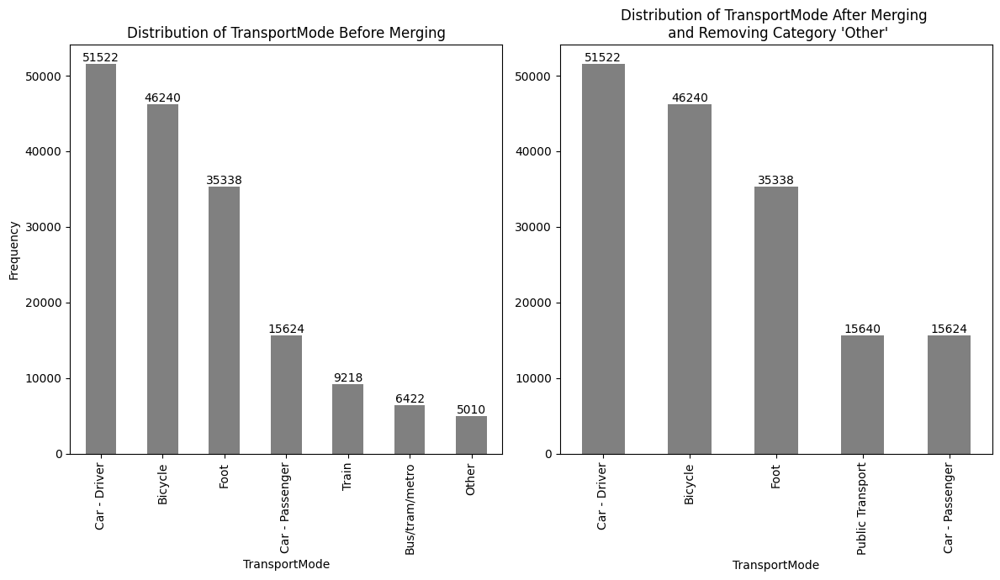

In [36]:
# Count transportMode after merging
mode_counts = merged_df['TransportMode'].value_counts(sort=True, ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(12, 7))

# Plot before merging
mode_counts_before_merging_exclusing.plot(kind="bar", title="Distribution of TransportMode Before Merging",
                                          xlabel="TransportMode", ylabel="Frequency", color='gray', ax=axes[0] )

# https://stackoverflow.com/questions/25447700/annotate-bars-with-values-on-pandas-bar-plots 
for container in axes[0].containers:
    axes[0].bar_label(container)

# Plot after merging
mode_counts.plot(kind="bar", title="Distribution of TransportMode After Merging \n and Removing Category 'Other'",
                  xlabel="TransportMode", color='gray', ax=axes[1])

# https://stackoverflow.com/questions/25447700/annotate-bars-with-values-on-pandas-bar-plots 
for container in axes[1].containers:
    axes[1].bar_label(container)


plt.tight_layout()
plt.savefig('target_feature.png', bbox_inches='tight')


plt.show()


<a id='section5'></a>
## EDA
[Back to Table of Contents](#Table-of-Contents)

In [37]:
# percentage each mode
for mode, count in (dict(merged_df.groupby(["TransportMode"]).size())).items(): 
    print(mode, (round(count / sum((dict(merged_df.groupby(["TransportMode"]).size())).values()), 2)) * 100,"%")

Bicycle 28.000000000000004 %
Car - Driver 31.0 %
Car - Passenger 10.0 %
Foot 21.0 %
Public Transport 10.0 %


In [38]:
# general information
print('Total Number of Trips: %d\nNumber of columns:%d\nTotal Number of Residents: %d' % (merged_df.shape[0],
                                                                                          len(merged_df.columns),                           
                                                                           len(merged_df['UniqueIdentifier'].unique())))

Total Number of Trips: 164364
Number of columns:39
Total Number of Residents: 45774


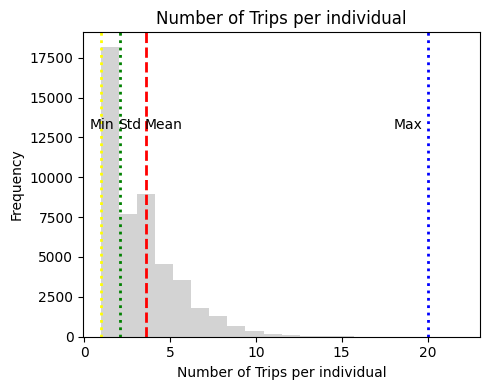

In [176]:
# average number of trips per individual
avg_trip_per_resident = merged_df['UniqueIdentifier'].value_counts().mean()
std_trip_per_resident = merged_df['UniqueIdentifier'].value_counts().std()
max_trip_per_resident = merged_df['UniqueIdentifier'].value_counts().max()
min_trip_per_resident = merged_df['UniqueIdentifier'].value_counts().min()

plt.figure(figsize=(5,4))
plt.hist(df['UniqueIdentifier'].value_counts(), bins=20, color = "lightgray") 
plt.axvline(avg_trip_per_resident, color='red', linestyle='--', linewidth=2)
plt.axvline(std_trip_per_resident, color='green', linestyle=':', linewidth=2)
plt.axvline(max_trip_per_resident, color='blue', linestyle=':', linewidth=2)
plt.axvline(min_trip_per_resident, color='yellow', linestyle=':', linewidth=2)
plt.xlabel('Number of Trips per individual')
plt.ylabel('Frequency')
plt.text(3.5, 13000, 'Mean', color = "black")
plt.text(2, 13000, 'Std', color = "black")
plt.text(18, 13000, 'Max', color = "black")
plt.text(0.3, 13000, 'Min', color = "black")
plt.title('Number of Trips per individual')

plt.tight_layout() 
plt.savefig('Trips_individual.pdf', bbox_inches='tight')
plt.show()

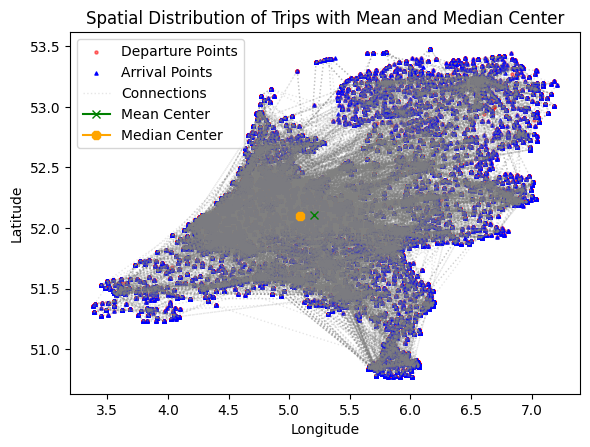

In [105]:
# part of this code is from: 
# https://stackoverflow.com/questions/59707946/merging-latitude-and-longitude-from-separate-columns-in-a-dataframe-then-use-hav
# https://stackoverflow.com/questions/69290957/how-to-plot-visualize-a-linestring-over-a-map
# https://automating-gis-processes.github.io/CSC/notebooks/L1/geometric-objects.html



geometry_departure = [Point(lon, lat) for lon, lat in zip(merged_df['LongitudeDeparture'], merged_df['LatitudeDeparture'])]
geometry_arrival = [Point(lon, lat) for lon, lat in zip(merged_df['LongitudeArrival'], merged_df['LatitudeArrival'])]

# departure and arrival points
gdf_departure = gpd.GeoDataFrame(merged_df, geometry=geometry_departure)
gdf_arrival = gpd.GeoDataFrame(merged_df, geometry=geometry_arrival)


# use lineString for geometries connection (not actual route taken)
geometry_connections = [LineString([Point(lon_dep, lat_dep), Point(lon_arr, lat_arr)]) 
                        for lon_dep, lat_dep, lon_arr, lat_arr 
                        in zip(merged_df['LongitudeDeparture'], merged_df['LatitudeDeparture'],
                               merged_df['LongitudeArrival'], merged_df['LatitudeArrival'])]

# connecting departure point with arrival point
gdf_connections = gpd.GeoDataFrame(merged_df, geometry=geometry_connections)

# mean and median center of departure points
mean_center = pointpats.centrography.mean_center(merged_df[['LongitudeDeparture', 'LatitudeDeparture']])
median_center = pointpats.centrography.euclidean_median(merged_df[['LongitudeDeparture', 'LatitudeDeparture']])


fig, ax = plt.subplots(figsize=(6, 6))

#  plot departure points
gdf_departure.plot(ax=ax, markersize=5, color='red', alpha=0.5, label='Departure Points', marker='o')

# plot arrival points
gdf_arrival.plot(ax=ax, markersize=5, color='blue', alpha=1, label='Arrival Points', marker='^')

# connections with dotted lines
gdf_connections.plot(ax=ax, color='gray', linewidth=1, linestyle='dotted', alpha=0.2, label='Connections')

# plot mean center
ax.plot(mean_center[0], mean_center[1], label='Mean Center', color='green', marker='x')

# plot median center
ax.plot(median_center[0], median_center[1], label='Median Center', color='orange', marker='8')

plt.title('Spatial Distribution of Trips with Mean and Median Center')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()

plt.tight_layout() 
plt.savefig('Tripdistribution.png', bbox_inches='tight')

plt.show()

In [39]:
# function to calculate the count per group and its corresponding percentage

def count_percentage(df, col): 
    grouped_counts = df.groupby([col, "TransportMode"]).size()
    total_count_per_group = df.groupby(col).size()
    total_count = df.shape[0]  
    percentage = grouped_counts / total_count * 100
    
    # combine counts and percentages into one df
    result_df = round(pd.concat([grouped_counts.rename('Count'), percentage.rename('Percentage')], axis=1),2)
    
    return result_df


In [40]:
count_percentage(merged_df, "License")

Count  Percentage
License TransportMode                      
No      Bicycle           15539        9.45
        Car - Passenger    6909        4.20
        Foot               8581        5.22
        Public Transport   6042        3.68
Yes     Bicycle           30701       18.68
        Car - Driver      51522       31.35
        Car - Passenger    8715        5.30
        Foot              26757       16.28
        Public Transport   9598        5.84

In [41]:
count_percentage(merged_df, "Gender")

Count  Percentage
Gender TransportMode                      
Female Bicycle           24251       14.75
       Car - Driver      22150       13.48
       Car - Passenger   10829        6.59
       Foot              19017       11.57
       Public Transport   8515        5.18
Male   Bicycle           21989       13.38
       Car - Driver      29372       17.87
       Car - Passenger    4795        2.92
       Foot              16321        9.93
       Public Transport   7125        4.33

In [42]:
count_percentage(merged_df, "NumberOfCarsInHousehold")

Count  Percentage
NumberOfCarsInHousehold TransportMode                      
0                       Bicycle            7250        4.41
                        Car - Driver       1153        0.70
                        Car - Passenger    1302        0.79
                        Foot               6054        3.68
                        Public Transport   5812        3.54
1                       Bicycle           24016       14.61
                        Car - Driver      23974       14.59
                        Car - Passenger    7500        4.56
                        Foot              17685       10.76
                        Public Transport   6219        3.78
2                       Bicycle           11916        7.25
                        Car - Driver      19695       11.98
                        Car - Passenger    5232        3.18
                        Foot               9137        5.56
                        Public Transport   2722        1.66
3                       Bicycle            2282        1.39
                        Car - Driver       4876        2.97
                        Car - Passenger    1168        0.71
                        Foot               1851        1.13
                        Public Transport    687        0.42
4 or more               Bicycle             776        0.47
                        Car - Driver       1824        1.11
                        Car - Passenger     422        0.26
                        Foot                611        0.37
                        Public Transport    200        0.12

In [43]:
count_percentage(merged_df, "EducationLevel")

Count  Percentage
EducationLevel TransportMode                      
High           Bicycle           18589       11.31
               Car - Driver      25926       15.77
               Car - Passenger    4713        2.87
               Foot              16063        9.77
               Public Transport   7837        4.77
Low            Bicycle           16282        9.91
               Car - Driver       7674        4.67
               Car - Passenger    7212        4.39
               Foot               9547        5.81
               Public Transport   2524        1.54
Medium         Bicycle           11369        6.92
               Car - Driver      17922       10.90
               Car - Passenger    3699        2.25
               Foot               9728        5.92
               Public Transport   5279        3.21

In [44]:
count_percentage(merged_df, "HouseholdSize")

Count  Percentage
HouseholdSize TransportMode                      
1             Bicycle            6723        4.09
              Car - Driver       7751        4.72
              Car - Passenger    1413        0.86
              Foot               6839        4.16
              Public Transport   3755        2.28
2             Bicycle           14895        9.06
              Car - Driver      19694       11.98
              Car - Passenger    5453        3.32
              Foot              13216        8.04
              Public Transport   4625        2.81
3             Bicycle            6165        3.75
              Car - Driver       8459        5.15
              Car - Passenger    2208        1.34
              Foot               4882        2.97
              Public Transport   2496        1.52
4             Bicycle           11680        7.11
              Car - Driver      11168        6.79
              Car - Passenger    4180        2.54
              Foot               6899        4.20
              Public Transport   3114        1.89
5 or more     Bicycle            6777        4.12
              Car - Driver       4450        2.71
              Car - Passenger    2370        1.44
              Foot               3502        2.13
              Public Transport   1650        1.00

In [45]:
pd.set_option('display.max_rows', None) # print all values
count_percentage(merged_df, "AgeClass")

Count  Percentage
AgeClass          TransportMode                      
12 to 14 years    Bicycle            3803        2.31
                  Car - Passenger    1155        0.70
                  Foot                716        0.44
                  Public Transport    394        0.24
15 to 17 years    Bicycle            2805        1.71
                  Car - Passenger     762        0.46
                  Foot                620        0.38
                  Public Transport   1058        0.64
18 to 19 years    Bicycle            1433        0.87
                  Car - Driver        645        0.39
                  Car - Passenger     546        0.33
                  Foot                681        0.41
                  Public Transport   1725        1.05
20 to 24 years    Bicycle            2453        1.49
                  Car - Driver       2444        1.49
                  Car - Passenger     951        0.58
                  Foot               1805        1.10
                  Public Transport   3332        2.03
25 to 29 years    Bicycle            2555        1.55
                  Car - Driver       3610        2.20
                  Car - Passenger     914        0.56
                  Foot               2338        1.42
                  Public Transport   2283        1.39
30 to 34 years    Bicycle            2513        1.53
                  Car - Driver       4500        2.74
                  Car - Passenger     919        0.56
                  Foot               2663        1.62
                  Public Transport   1550        0.94
35 to 39 years    Bicycle            2560        1.56
                  Car - Driver       4423        2.69
                  Car - Passenger     582        0.35
                  Foot               2261        1.38
                  Public Transport    779        0.47
40 to 44 years    Bicycle            3018        1.84
                  Car - Driver       4636        2.82
                  Car - Passenger     628        0.38
                  Foot               2433        1.48
                  Public Transport    755        0.46
45 to 49 years    Bicycle            2752        1.67
                  Car - Driver       5103        3.10
                  Car - Passenger     620        0.38
                  Foot               2364        1.44
                  Public Transport    686        0.42
50 to 54 years    Bicycle            3156        1.92
                  Car - Driver       6106        3.71
                  Car - Passenger     807        0.49
                  Foot               2958        1.80
                  Public Transport    773        0.47
55 to 59 years    Bicycle            2753        1.67
                  Car - Driver       4662        2.84
                  Car - Passenger     773        0.47
                  Foot               2588        1.57
                  Public Transport    634        0.39
6 to 11 years     Bicycle            3976        2.42
                  Car - Passenger    3013        1.83
                  Foot               2687        1.63
                  Public Transport    156        0.09
60 to 64 years    Bicycle            2979        1.81
                  Car - Driver       4294        2.61
                  Car - Passenger     807        0.49
                  Foot               2698        1.64
                  Public Transport    548        0.33
65 to 69 years    Bicycle            3297        2.01
                  Car - Driver       3690        2.25
                  Car - Passenger     958        0.58
                  Foot               2741        1.67
                  Public Transport    373        0.23
70 to 74 years    Bicycle            2650        1.61
                  Car - Driver       2797        1.70
                  Car - Passenger     743        0.45
                  Foot               2128        1.29
                  Public Transport    230        0.14
75 to 79 years    Bicycle            240

In [46]:
count_percentage(merged_df, "TripPurpose")

Count  Percentage
TripPurpose            TransportMode                      
Leisure Activities     Bicycle           16071        9.78
                       Car - Driver      13931        8.48
                       Car - Passenger    8342        5.08
                       Foot              20841       12.68
                       Public Transport   4279        2.60
Maintenance Activities Bicycle           12397        7.54
                       Car - Driver      14048        8.55
                       Car - Passenger    3875        2.36
                       Foot               8761        5.33
                       Public Transport   1538        0.94
Other motive           Bicycle            4499        2.74
                       Car - Driver       9029        5.49
                       Car - Passenger    1502        0.91
                       Foot               2916        1.77
                       Public Transport    808        0.49
Subsistence Activities Bicycle           13273        8.08
                       Car - Driver      14514        8.83
                       Car - Passenger    1905        1.16
                       Foot               2820        1.72
                       Public Transport   9015        5.48

In [47]:
count_percentage(merged_df, "DisposableIncome")

Count  Percentage
DisposableIncome  TransportMode                      
Eighth 10% group  Bicycle            6057        3.69
                  Car - Driver       7403        4.50
                  Car - Passenger    2098        1.28
                  Foot               4280        2.60
                  Public Transport   1818        1.11
Fifth 10% group   Bicycle            4173        2.54
                  Car - Driver       4520        2.75
                  Car - Passenger    1447        0.88
                  Foot               3255        1.98
                  Public Transport   1233        0.75
First 10% group   Bicycle            2649        1.61
                  Car - Driver       1415        0.86
                  Car - Passenger     684        0.42
                  Foot               2438        1.48
                  Public Transport   2023        1.23
Fourth 10% group  Bicycle            3971        2.42
                  Car - Driver       4033        2.45
                  Car - Passenger    1395        0.85
                  Foot               3151        1.92
                  Public Transport   1243        0.76
Ninth 10% group   Bicycle            6571        4.00
                  Car - Driver       8547        5.20
                  Car - Passenger    2223        1.35
                  Foot               4765        2.90
                  Public Transport   2045        1.24
Second 10% group  Bicycle            2355        1.43
                  Car - Driver       1876        1.14
                  Car - Passenger     854        0.52
                  Foot               2258        1.37
                  Public Transport   1111        0.68
Seventh 10% group Bicycle            5491        3.34
                  Car - Driver       6210        3.78
                  Car - Passenger    1836        1.12
                  Foot               3768        2.29
                  Public Transport   1694        1.03
Sixth 10% group   Bicycle            5025        3.06
                  Car - Driver       5522        3.36
                  Car - Passenger    1680        1.02
                  Foot               3563        2.17
                  Public Transport   1407        0.86
Tenth 10% group   Bicycle            6925        4.21
                  Car - Driver       9009        5.48
                  Car - Passenger    2321        1.41
                  Foot               5137        3.13
                  Public Transport   2095        1.27
Third 10% group   Bicycle            3023        1.84
                  Car - Driver       2987        1.82
                  Car - Passenger    1086        0.66
                  Foot               2723        1.66
                  Public Transport    971        0.59

In [48]:
count_percentage(merged_df, "FrequencyOfUseCcarAsAPassenger")


Count  Percentage
FrequencyOfUseCcarAsAPassenger TransportMode                      
Daily or almost daily          Bicycle            1286        0.78
                               Car - Driver       1578        0.96
                               Car - Passenger    2556        1.56
                               Foot               1194        0.73
                               Public Transport    468        0.28
Never or almost never          Bicycle            5653        3.44
                               Car - Driver       8883        5.40
                               Car - Passenger     220        0.13
                               Foot               5362        3.26
                               Public Transport   1623        0.99
Several times a month          Bicycle           16790       10.22
                               Car - Driver      17733       10.79
                               Car - Passenger    3567        2.17
                               Foot              11845        7.21
                               Public Transport   6568        4.00
Several times a week           Bicycle           14345        8.73
                               Car - Driver      12121        7.37
                               Car - Passenger    8754        5.33
                               Foot               9973        6.07
                               Public Transport   3942        2.40
Several times a year           Bicycle            8166        4.97
                               Car - Driver      11207        6.82
                               Car - Passenger     527        0.32
                               Foot               6964        4.24
                               Public Transport   3039        1.85

In [49]:
count_percentage(merged_df, "FrequencyOfUseOfNonEelectricBicycle")

Count  Percentage
FrequencyOfUseOfNonEelectricBicycle TransportMode                      
Daily or almost daily               Bicycle           26810       16.31
                                    Car - Driver       6786        4.13
                                    Car - Passenger    4817        2.93
                                    Foot               8926        5.43
                                    Public Transport   6811        4.14
Never or almost never               Bicycle            7822        4.76
                                    Car - Driver      16904       10.28
                                    Car - Passenger    4103        2.50
                                    Foot               9798        5.96
                                    Public Transport   2300        1.40
Several times a month               Bicycle            1873        1.14
                                    Car - Driver       9118        5.55
                                    Car - Passenger    1826        1.11
                                    Foot               4507        2.74
                                    Public Transport   1670        1.02
Several times a week                Bicycle            8385        5.10
                                    Car - Driver      12582        7.65
                                    Car - Passenger    3818        2.32
                                    Foot               9638        5.86
                                    Public Transport   3888        2.37
Several times a year                Bicycle            1350        0.82
                                    Car - Driver       6132        3.73
                                    Car - Passenger    1060        0.64
                                    Foot               2469        1.50
                                    Public Transport    971        0.59

In [50]:
count_percentage(merged_df, "FrequencyOfWalkingOutdoors")

Count  Percentage
FrequencyOfWalkingOutdoors TransportMode                      
Daily or almost daily      Bicycle           25514       15.52
                           Car - Driver      25781       15.69
                           Car - Passenger    8718        5.30
                           Foot              27095       16.48
                           Public Transport  10164        6.18
Never or almost never      Bicycle            1109        0.67
                           Car - Driver       1644        1.00
                           Car - Passenger     452        0.27
                           Foot                208        0.13
                           Public Transport    163        0.10
Several times a month      Bicycle            3536        2.15
                           Car - Driver       5190        3.16
                           Car - Passenger    1180        0.72
                           Foot                864        0.53
                           Public Transport    836        0.51
Several times a week       Bicycle           15337        9.33
                           Car - Driver      17906       10.89
                           Car - Passenger    5029        3.06
                           Foot               7041        4.28
                           Public Transport   4335        2.64
Several times a year       Bicycle             744        0.45
                           Car - Driver       1001        0.61
                           Car - Passenger     245        0.15
                           Foot                130        0.08
                           Public Transport    142        0.09

In [51]:
count_percentage(merged_df,  "WorkCommuteReimbursement")

Count  Percentage
WorkCommuteReimbursement TransportMode                      
No reimbursement         Bicycle            8812        5.36
                         Car - Driver       8014        4.88
                         Car - Passenger    1764        1.07
                         Foot               4509        2.74
                         Public Transport   2207        1.34
Not applicable           Bicycle           25335       15.41
                         Car - Driver      17130       10.42
                         Car - Passenger   10165        6.18
                         Foot              19685       11.98
                         Public Transport   6854        4.17
Reimbursement provided   Bicycle           12093        7.36
                         Car - Driver      26378       16.05
                         Car - Passenger    3695        2.25
                         Foot              11144        6.78
                         Public Transport   6579        4.00

In [52]:
# file:///C:/Users/Wafa/Downloads/1_s2.0_S0965856418315696_main.pdf
count_percentage(merged_df, "Weekday")

Count  Percentage
Weekday TransportMode                      
weekday Bicycle           36278       22.07
        Car - Driver      38673       23.53
        Car - Passenger    9213        5.61
        Foot              25430       15.47
        Public Transport  12893        7.84
weekend Bicycle            9962        6.06
        Car - Driver      12849        7.82
        Car - Passenger    6411        3.90
        Foot               9908        6.03
        Public Transport   2747        1.67

In [54]:
# summary statistics for mode and trip features  
numerical_features = ["Duration_by_driving", "Duration_by_foot", "Duration_by_cycling", "TripLegDistance", "TotalTravelDuration", "NumberOfTripLegs"]
std=merged_df[numerical_features].std().round(2)
mean = merged_df[numerical_features].mean().round(2)
mx = merged_df[numerical_features].max().round(2)
mn = merged_df[numerical_features].min().round(2)
sum_stats = pd.DataFrame({'Std': std, 'Mean': mean, 'Max': mx,'Min': mn})
sum_stats["Kurtosis"] = merged_df[numerical_features].kurtosis().round(2)
sum_stats["Skewness"] = merged_df[numerical_features].skew().round(2)
sum_stats

,Std,Mean,Max,Min,Kurtosis,Skewness
Duration_by_driving,1176.73,702.30,18814.7,0.0,20.16,3.69
Duration_by_foot,17100.78,7886.94,228038.3,0.0,25.06,4.33
Duration_by_cycling,5111.81,2456.47,65477.7,0.0,22.20,4.11
TripLegDistance,196.04,95.36,6600.0,1.0,44.52,5.17
TotalTravelDuration,40.78,29.74,880.0,1.0,45.86,5.15
NumberOfTripLegs,0.73,1.24,12.0,1.0,14.05,3.43


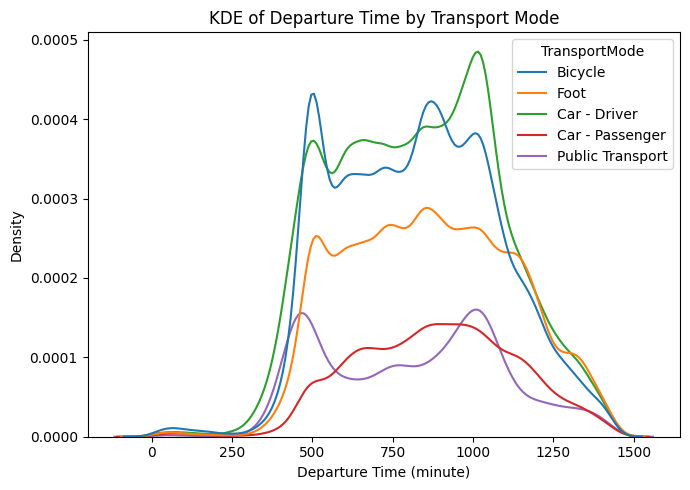

In [64]:
# kde plot for departure time
time = ["DepartureTime"]

num_rows = 1
num_cols = 1
fig, axes = plt.subplots(num_rows, num_cols, figsize=(7, 5))
if not isinstance(axes, np.ndarray):
    axes = [axes]

for i, feature in enumerate(time):
    ax = axes[i]
    sns.kdeplot(data=merged_df, x=feature, hue='TransportMode', fill=False, ax=ax, alpha=1)
    ax.set_title("KDE of Departure Time by Transport Mode")
    ax.set_xlabel("Departure Time (minute)")
    ax.set_ylabel("Density")


plt.tight_layout()
plt.savefig('time.pdf', bbox_inches='tight')
plt.show()


<a id='section7'></a>
## Spatial Autocorrelation
[Back to Table of Contents](#Table-of-Contents)

In [56]:
lst =["SurroundingAddressDensity","AvgDistToTrainStation","NumBusStops",
    'RoadNetworkDensity',"AvgDistToSupermarket",
   "NofBusinessEstablishments"] # extract built environment features to spatial analysis

In [57]:
# Source dataset: https://www.cbs.nl/nl-nl/dossier/nederland-regionaal/geografische-data/gegevens-per-postcode
# extracting geometry code of each postcode
gpkg = gpd.read_file("cbs_pc4_2022_v1.gpkg")
gpkg["postcode4"]= gpkg["postcode4"].astype("int64")
gpkg = gpkg[["postcode4", "geometry"]]
gpkg.info()


relevant_columns = ["HomePostalCode"] + lst
subset_df = merged_df[relevant_columns]
subset_df.drop_duplicates('HomePostalCode', inplace = True)
gdf= pd.merge(subset_df, gpkg, left_on='HomePostalCode',
                     right_on="postcode4", how='left')
gdf = gpd.GeoDataFrame(gdf, geometry='geometry')
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   postcode4  4070 non-null   int64   
 1   geometry   4070 non-null   geometry
dtypes: geometry(1), int64(1)
memory usage: 63.7 KB
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3343 entries, 0 to 3342
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   HomePostalCode             3343 non-null   int64   
 1   SurroundingAddressDensity  3343 non-null   float64 
 2   AvgDistToTrainStation      3343 non-null   float64 
 3   NumBusStops                3343 non-null   int64   
 4   RoadNetworkDensity         3343 non-null   float64 
 5   AvgDistToSupermarket       3343 non-null   float64 
 6   NofBusinessEstablishments  3343 non-null   float64 
 7   postcode4                  3343 non-nu

In [58]:
relevant_columns = ["HomePostalCode"] + lst
subset_df = merged_df[relevant_columns]
subset_df.drop_duplicates('HomePostalCode', inplace = True)
gdf= pd.merge(subset_df, gpkg, left_on='HomePostalCode',
                     right_on="postcode4", how='left')
gdf = gpd.GeoDataFrame(gdf, geometry='geometry')
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3343 entries, 0 to 3342
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   HomePostalCode             3343 non-null   int64   
 1   SurroundingAddressDensity  3343 non-null   float64 
 2   AvgDistToTrainStation      3343 non-null   float64 
 3   NumBusStops                3343 non-null   int64   
 4   RoadNetworkDensity         3343 non-null   float64 
 5   AvgDistToSupermarket       3343 non-null   float64 
 6   NofBusinessEstablishments  3343 non-null   float64 
 7   postcode4                  3343 non-null   int64   
 8   geometry                   3343 non-null   geometry
dtypes: float64(5), geometry(1), int64(3)
memory usage: 235.2 KB


In [59]:
# summary statistics  for be features    
std=gdf[lst].std().round(2)
mean = gdf[lst].mean().round(2)
mx = gdf[lst].max().round(2)
mn = gdf[lst].min().round(2)
sum_stats = pd.DataFrame({'Std': std, 'Mean': mean, 'Max': mx,'Min': mn})
sum_stats["Kurtosis"] = gdf[lst].kurtosis().round(2)
sum_stats["Skewness"] = gdf[lst].skew().round(2)
sum_stats

,Std,Mean,Max,Min,Kurtosis,Skewness
SurroundingAddressDensity,1473.67,1146.42,12340.0,1.0,10.02,2.62
AvgDistToTrainStation,7.06,6.93,58.0,0.1,10.97,2.77
NumBusStops,6.89,8.59,46.0,0.0,1.18,1.08
RoadNetworkDensity,905.51,1043.96,6284.0,18.0,2.11,1.25
AvgDistToSupermarket,1.42,1.69,10.6,0.1,2.20,1.46
NofBusinessEstablishments,290.39,215.10,5475.0,0.0,46.39,4.79


In [35]:
# calculate the spatial lag for knn 4, 8, 16
d = [] 

for k in [8, 16]: 
    knn = weights.KNN.from_dataframe(gdf, k=k)
    knn.transform = "R"

    for feature in lst:  
        mknn = esda.moran.Moran(gdf[feature], knn)
        d.append(("KNN-" + str(k),feature,  mknn.I, mknn.p_sim))

In [36]:
# calculate spatial lag based on queen 
queen = weights.Queen.from_dataframe(gdf,silence_warnings = True)
queen.transform = "R"

for feature in lst:  
    m_queen = esda.moran.Moran(gdf[feature], queen)
    d.append(("Queen",feature,  m_queen.I, m_queen.p_sim))

In [37]:
# calculate spatial lag based on rook
rook = weights.Rook.from_dataframe(gdf,silence_warnings = True)
rook.transform = "R"

for feature in lst:  
    m_rook = esda.moran.Moran(gdf[feature], rook)
    d.append(("Rook",feature,  m_rook.I, m_rook.p_sim))

In [38]:
# calculate spatial lag based on distance_band 
distance_band = weights.distance.DistanceBand.from_dataframe(gdf, 5000,silence_warnings = True)
distance_band.transform = "R"

for feature in lst:  
    m_distance_band = esda.moran.Moran(gdf[feature], distance_band)
    d.append(("DistanceBand (5000)",feature,  m_distance_band.I, m_distance_band.p_sim))

In [39]:
# calculate spatial lag based on distance_band 
distance_band = weights.distance.DistanceBand.from_dataframe(gdf, 10000,silence_warnings = True)
distance_band.transform = "R"

for feature in lst:  
    m_distance_band = esda.moran.Moran(gdf[feature], distance_band)
    d.append(("DistanceBand (10000)",feature,  m_distance_band.I, m_distance_band.p_sim))

In [40]:
# combine all matrix into one dataframe
spatial_df = pd.DataFrame(d, columns=['Weight_Matrix', 'Feature', "Moran's I", 'p-value'])
pivoted_df = spatial_df.pivot(index=['Weight_Matrix', 'p-value', ], columns='Feature', values="Moran's I")

pivoted_df

,Feature,AvgDistToSupermarket,AvgDistToTrainStation,NofBusinessEstablishments,NumBusStops,RoadNetworkDensity,SurroundingAddressDensity
Weight_Matrix,p-value,,,,,,
DistanceBand (10000),0.001,0.153543,0.751295,0.267604,0.290798,0.360880,0.423954
DistanceBand (5000),0.001,0.275985,0.883666,0.404894,0.509501,0.592889,0.638068
KNN-16,0.001,0.194989,0.725509,0.449699,0.488544,0.562498,0.716956
KNN-8,0.001,0.239921,0.836626,0.476150,0.590183,0.684358,0.790117
Queen,0.001,0.285428,0.881022,0.433239,0.621864,0.701888,0.748216
Rook,0.001,0.290566,0.882185,0.435576,0.622355,0.703162,0.752467


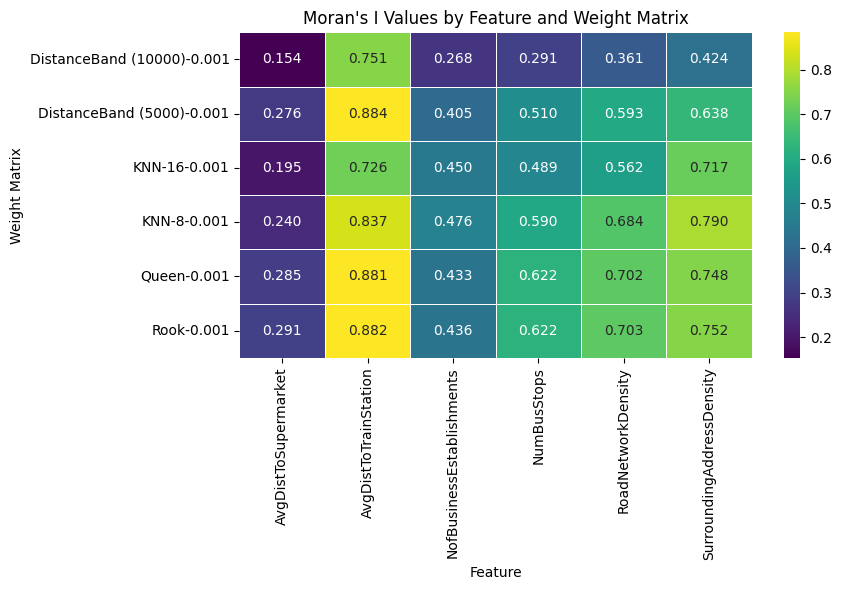

In [41]:
# using heatmap visualize the moran I 
plt.figure(figsize=(9, 6))
sns.heatmap(pivoted_df, cmap='viridis', annot=True, fmt=".3f", linewidths=.5)
plt.title("Moran's I Values by Feature and Weight Matrix")
plt.xlabel('Feature')
plt.ylabel('Weight Matrix')

plt.tight_layout()
plt.savefig('Weight Matrix.pdf', bbox_inches='tight')
plt.show()


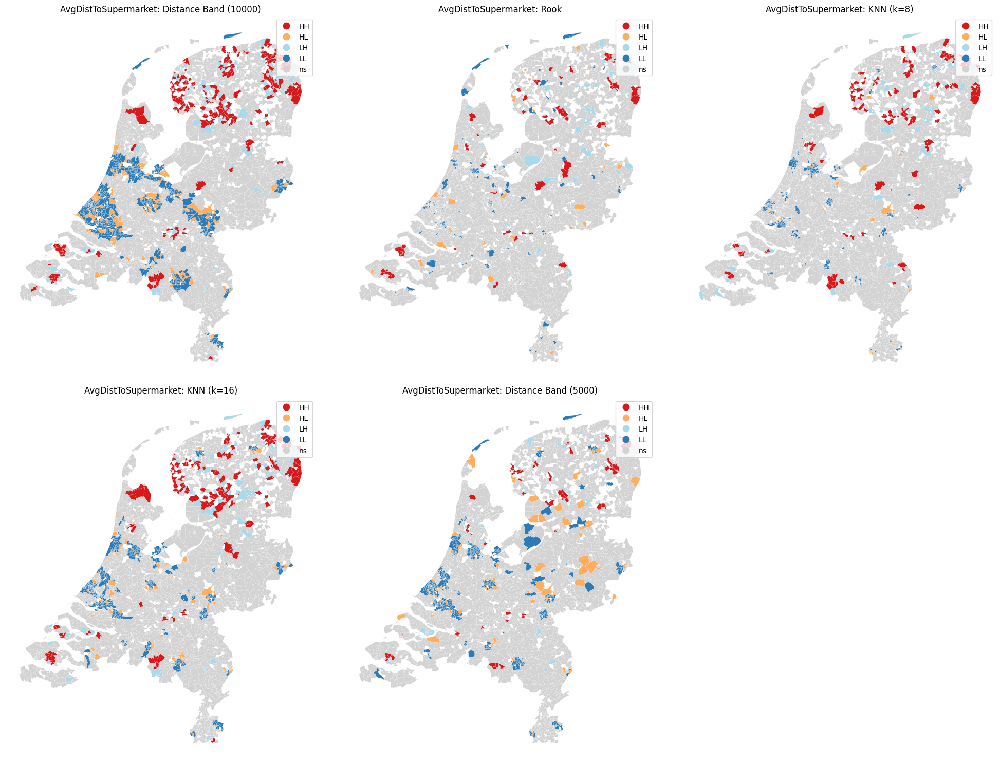

In [42]:
# create spatial weight matrix to visualize hotspots 
q = weights.Queen.from_dataframe(gdf, silence_warnings=True)
r = weights.Rook.from_dataframe(gdf, silence_warnings=True)
k8 = weights.KNN.from_dataframe(gdf, k=8)
k15 = weights.KNN.from_dataframe(gdf, k=15)
dist5000 = weights.distance.DistanceBand.from_dataframe(gdf, 5000, silence_warnings=True)
dist10000 = weights.distance.DistanceBand.from_dataframe(gdf, 10000, silence_warnings=True)


fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["AvgDistToSupermarket"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("AvgDistToSupermarket: Distance Band (10000)")

mr = Moran_Local(gdf["AvgDistToSupermarket"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("AvgDistToSupermarket: Rook")

mk8 = Moran_Local(gdf["AvgDistToSupermarket"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("AvgDistToSupermarket: KNN (k=8)")

mk15 = Moran_Local(gdf["AvgDistToSupermarket"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("AvgDistToSupermarket: KNN (k=16)")

mdist = Moran_Local(gdf["AvgDistToSupermarket"], dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("AvgDistToSupermarket: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("AvgDistToSupermarket")
plt.show()


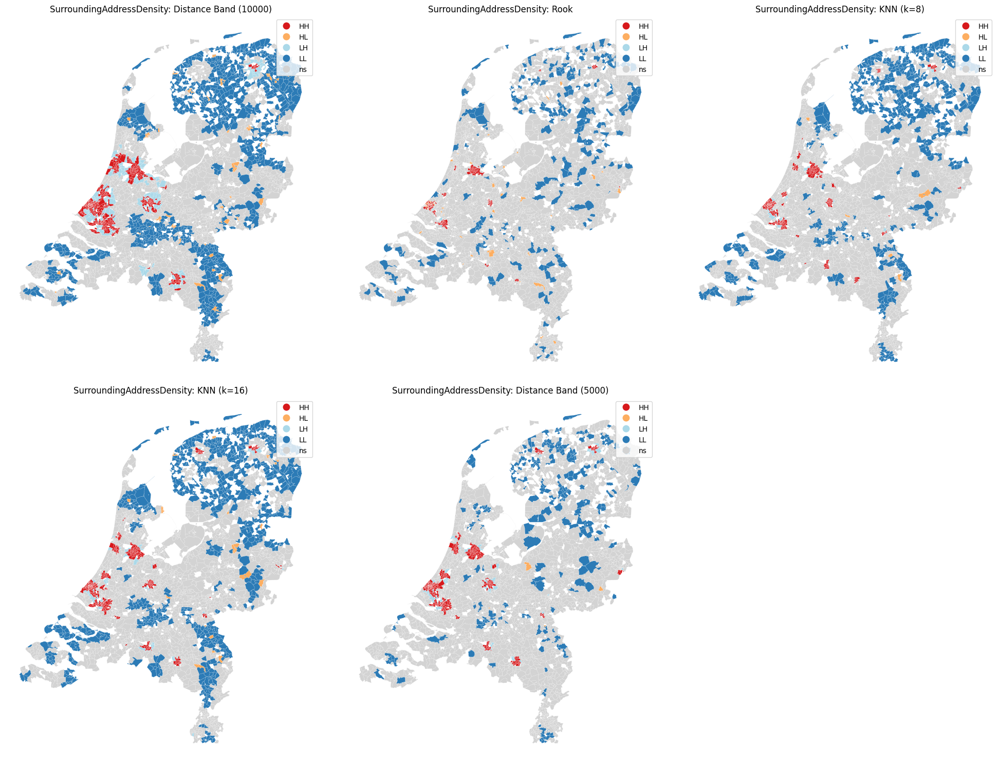

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["SurroundingAddressDensity"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("SurroundingAddressDensity: Distance Band (10000)")

mr = Moran_Local(gdf["SurroundingAddressDensity"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("SurroundingAddressDensity: Rook")

mk8 = Moran_Local(gdf["SurroundingAddressDensity"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("SurroundingAddressDensity: KNN (k=8)")

mk15 = Moran_Local(gdf["SurroundingAddressDensity"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("SurroundingAddressDensity: KNN (k=16)")

mdist = Moran_Local(gdf["SurroundingAddressDensity"], dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("SurroundingAddressDensity: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("SurroundingAddressDensity")
plt.show()




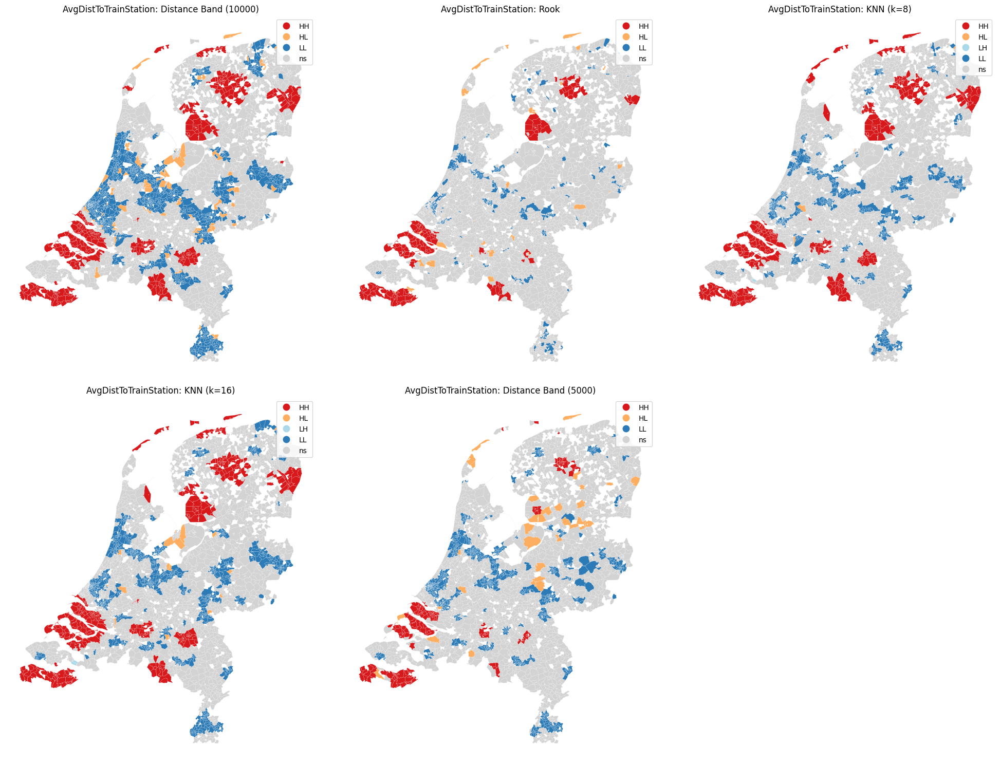

In [44]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["AvgDistToTrainStation"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("AvgDistToTrainStation: Distance Band (10000)")

mr = Moran_Local(gdf["AvgDistToTrainStation"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("AvgDistToTrainStation: Rook")

mk8 = Moran_Local(gdf["AvgDistToTrainStation"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("AvgDistToTrainStation: KNN (k=8)")

mk15 = Moran_Local(gdf["AvgDistToTrainStation"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("AvgDistToTrainStation: KNN (k=16)")

mdist = Moran_Local(gdf["AvgDistToTrainStation"], dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("AvgDistToTrainStation: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("AvgDistToTrainStation")
plt.show()




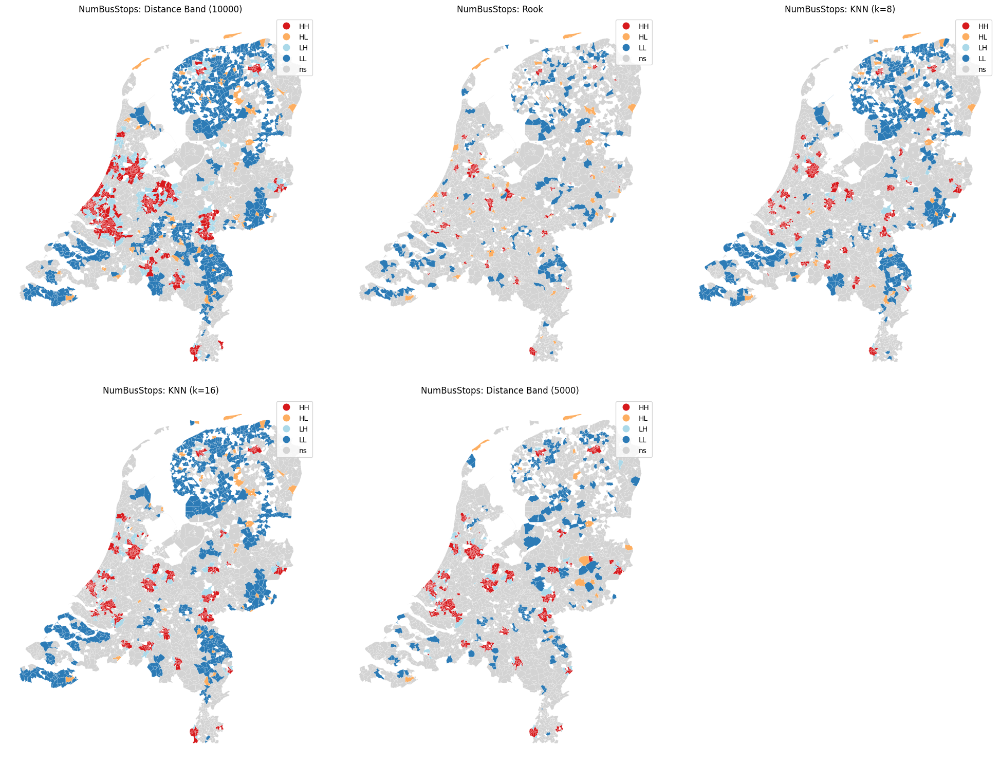

In [45]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["NumBusStops"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("NumBusStops: Distance Band (10000)")

mr = Moran_Local(gdf["NumBusStops"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("NumBusStops: Rook")

mk8 = Moran_Local(gdf["NumBusStops"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("NumBusStops: KNN (k=8)")

mk15 = Moran_Local(gdf["NumBusStops"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("NumBusStops: KNN (k=16)")

mdist = Moran_Local(gdf["NumBusStops"], dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("NumBusStops: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("NumBusStops")
plt.show()




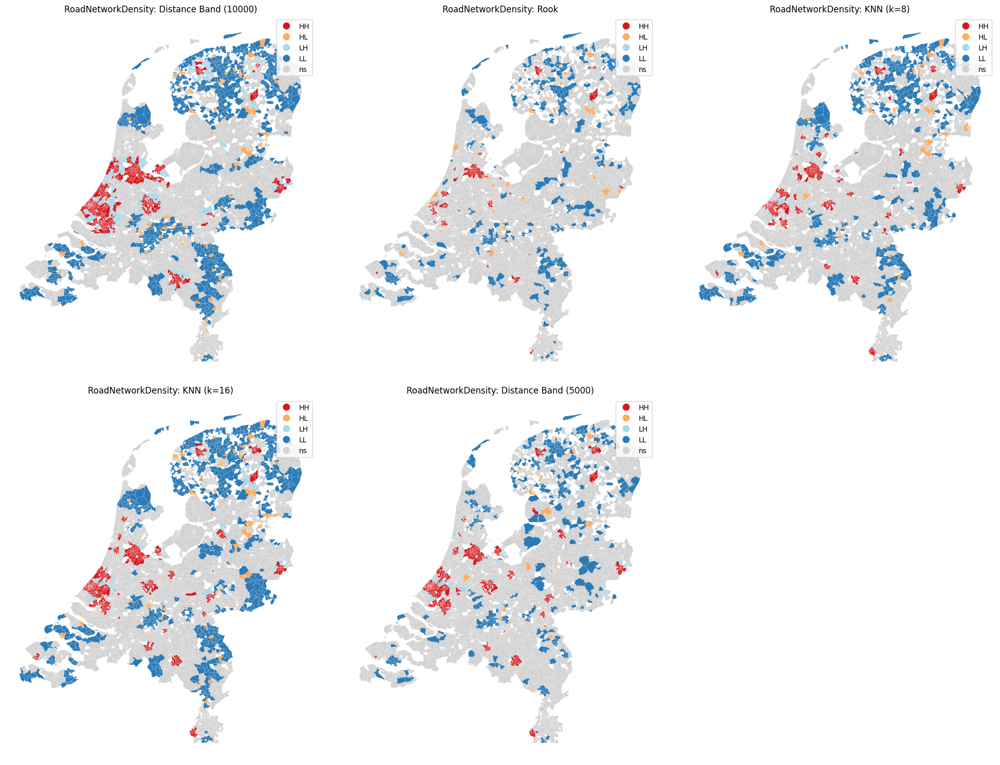

In [46]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["RoadNetworkDensity"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("RoadNetworkDensity: Distance Band (10000)")

mr = Moran_Local(gdf["RoadNetworkDensity"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("RoadNetworkDensity: Rook")

mk8 = Moran_Local(gdf["RoadNetworkDensity"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("RoadNetworkDensity: KNN (k=8)")

mk15 = Moran_Local(gdf["RoadNetworkDensity"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("RoadNetworkDensity: KNN (k=16)")

mdist = Moran_Local(gdf["RoadNetworkDensity"], dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("RoadNetworkDensity: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("RoadNetworkDensity")
plt.show()




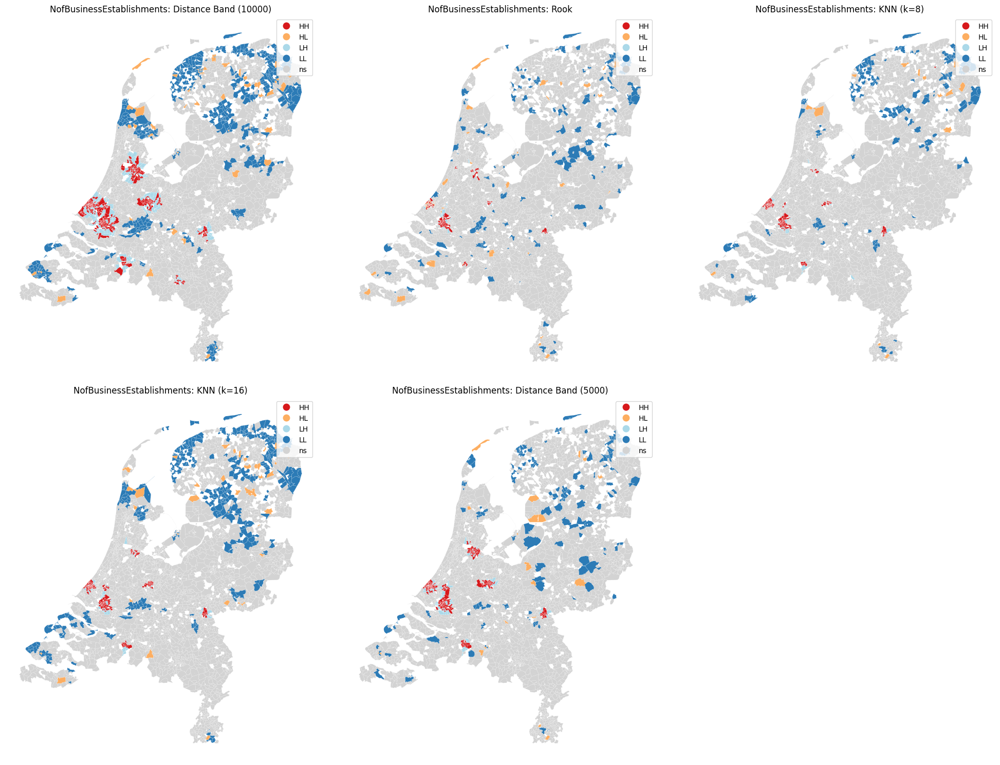

In [47]:
fig, axes = plt.subplots(2, 3, figsize=(20, 15))

mdist10000 = Moran_Local(gdf["NofBusinessEstablishments"], dist10000)
lisa_cluster(mdist10000, gdf, p=0.01, ax=axes[0, 0])
axes[0, 0].set_title("NofBusinessEstablishments: Distance Band (10000)")

mr = Moran_Local(gdf["NofBusinessEstablishments"], r)
lisa_cluster(mr, gdf, p=0.01, ax=axes[0, 1])
axes[0, 1].set_title("NofBusinessEstablishments: Rook")

mk8 = Moran_Local(gdf["NofBusinessEstablishments"], k8)
lisa_cluster(mk8, gdf, p=0.01, ax=axes[0, 2])
axes[0, 2].set_title("NofBusinessEstablishments: KNN (k=8)")

mk15 = Moran_Local(gdf["NofBusinessEstablishments"], k15)
lisa_cluster(mk15, gdf, p=0.01, ax=axes[1, 0])
axes[1, 0].set_title("NofBusinessEstablishments: KNN (k=16)")

mdist = Moran_Local(gdf["NofBusinessEstablishments"],dist5000)
lisa_cluster(mdist, gdf, p=0.01, ax=axes[1, 1])
axes[1, 1].set_title("NofBusinessEstablishments: Distance Band (5000)")

# Remove the empty plot
fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.savefig("NofBusinessEstablishments")
plt.show()

In [33]:
# drop "MostCommonPostalCode as it is not needed anymore
merged_df.drop(["MostCommonPostalCode"], inplace = True, axis = 1)

<a id='section8'></a>
## Correlation (Phik)
[Back to Table of Contents](#Table-of-Contents)

In [60]:
# calculate correlation
columns_to_exclude = ['TransportMode', 'UniqueIdentifier', 'HomePostalCode', "Residential Municipality", "ResidentialProvince",] 
# exclude these columns the correlation calculatin
correlation_matrix =merged_df.loc[:, ~merged_df.columns.isin(columns_to_exclude)].phik_matrix()


interval columns not set, guessing: ['N.OFHouseholdMemberUnd6', 'NumberOfTripLegs', 'TotalTravelDuration', 'TripLegDistance', 'LatitudeLiving', 'LongitudeLiving', 'LatitudeArrival', 'LongitudeArrival', 'LatitudeDeparture', 'LongitudeDeparture', 'Duration_by_driving', 'Duration_by_foot', 'Duration_by_cycling', 'RoadNetworkDensity', 'NumBusStops', 'DepartureTime', 'AvgDistToTrainStation', 'AvgDistToSupermarket', 'NofBusinessEstablishments', 'SurroundingAddressDensity']


In [61]:
# correlated pairs
highly_correlated_pairs = (correlation_matrix.abs() > 0.8) & (correlation_matrix < 1)


# correlated features
correlated_features = set()
for col in highly_correlated_pairs.columns:
    correlated_features.update(highly_correlated_pairs.index[highly_correlated_pairs[col]])
print(correlated_features)
print(len(correlated_features))

{'LatitudeLiving', 'LongitudeDeparture', 'LatitudeDeparture', 'Duration_by_driving', 'Duration_by_foot', 'NumBusStops', 'LongitudeLiving', 'Duration_by_cycling', 'RoadNetworkDensity', 'LongitudeArrival', 'LatitudeArrival'}
11


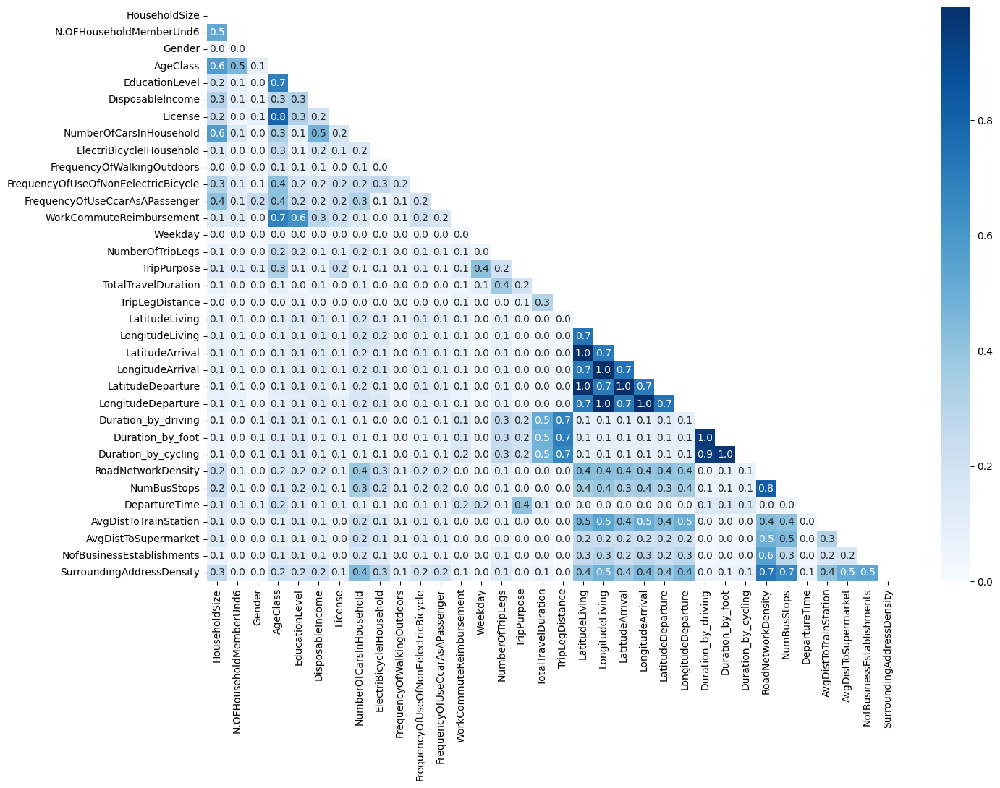

In [63]:
#part of this code is from: 
# https://stackoverflow.com/questions/66709299/how-to-mask-the-upper-triangle-of-a-covariance-matrix-in-sns-heatmap-along-with

# correlation before removing highly correlated features
trimask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
plt.figure(figsize=(15,11))
sns.heatmap(correlation_matrix, cmap='Blues', annot=True, mask=trimask, fmt=".1f")

plt.tight_layout()

plt.savefig('conf_before', bbox_inches='tight')
plt.show()

In [34]:
# features to be dropped after correlation matrix
# Duration_by_driving,Duration_by_foot, Duration_by_cycling : these features are kept and going to be used to create new feauteres after train test split
exclude_columns = ['LongitudeDeparture',  'LatitudeDeparture', 'LatitudeArrival',"LongitudeArrival"] 
len(exclude_columns)

4

In [35]:
# dataset without correlated features
df_no_correlation =merged_df.loc[:, ~merged_df.columns.isin(exclude_columns)]
print(df_no_correlation[df_no_correlation.duplicated()].shape)
df_no_correlation.drop_duplicates(inplace=True)
df_no_correlation.to_csv('df_no_correlation.csv', index=False)
df_no_correlation.head(1)


(0, 35)


,UniqueIdentifier,HouseholdSize,N.OFHouseholdMemberUnd6,HomePostalCode,Residential Municipality,ResidentialProvince,Gender,AgeClass,EducationLevel,DisposableIncome,License,NumberOfCarsInHousehold,ElectriBicycleIHousehold,FrequencyOfWalkingOutdoors,FrequencyOfUseOfNonEelectricBicycle,FrequencyOfUseCcarAsAPassenger,WorkCommuteReimbursement,Weekday,NumberOfTripLegs,TripPurpose,TransportMode,TotalTravelDuration,TripLegDistance,LatitudeLiving,LongitudeLiving,Duration_by_driving,Duration_by_foot,Duration_by_cycling,RoadNetworkDensity,NumBusStops,DepartureTime,AvgDistToTrainStation,AvgDistToSupermarket,NofBusinessEstablishments,SurroundingAddressDensity
0,300000882980,2,0,9481,1730,Drenthe,Female,65 to 69 years,Low,Sixth 10% group,Yes,3,Yes,Daily or almost daily,Daily or almost daily,Several times a week,Not applicable,weekday,1,Other motive,Bicycle,5.0,10.0,53.0726,6.5768,0.0,0.0,0.0,719.0,4,645.0,10.3,0.8,380.0,428.0


In [68]:
df_no_correlation.isna().sum()

UniqueIdentifier                       0
HouseholdSize                          0
N.OFHouseholdMemberUnd6                0
HomePostalCode                         0
Residential Municipality               0
InhabitantClass                        0
ResidentialProvince                    0
Gender                                 0
AgeClass                               0
EducationLevel                         0
DisposableIncome                       0
License                                0
NumberOfCarsInHousehold                0
ElectriBicycleIHousehold               0
FrequencyOfWalkingOutdoors             0
FrequencyOfUseOfNonEelectricBicycle    0
FrequencyOfUseCcarAsAPassenger         0
WorkCommuteReimbursement               0
Weekday                                0
Holiday                                0
NumberOfTripLegs                       0
TripPurpose                            0
TransportMode                          0
TotalTravelDuration                    0
ChildrenUn6Inclu